# pymaid
`pymaid` ("python-catmaid") lets you interface with a CATMAID server such as those provided by VFB to host published data from the FAFB dataset. It's built on top of `navis` and returns generally returns data (neurons, volumes) in a way that you can plug them straight into navis - e.g. for plotting.

## Connecting
The VFB servers (see [here](https://catmaid.virtualflybrain.org/) what's available) are public and don't require an API token for read-access which makes connecting dead simple:

In [ ]:
import pymaid
import navis

navis.set_pbars(jupyter=False)
pymaid.set_pbars(jupyter=False)

# Connect to the VFB CATMAID server hosting the FAFB data
rm = pymaid.connect_catmaid(server="https://fafb.catmaid.virtualflybrain.org/", api_token=None, max_threads=10)

# Test call to see if connection works 
print(f'Server is running CATMAID version {rm.catmaid_version}')

INFO  : Global CATMAID instance set. Caching is ON. (pymaid)
Server is running CATMAID version 2020.02.15-905-g93a969b37


We will cover how to search the VFB data base for neurons you might want to pull from the CATMAID server elsewhere. Instead, this notebook should give you a flavour of what kind of data you can pull and how to handle it.

## Pulling neurons
Let's start with pulling neurons:

In [ ]:
# Pull a neuron by its ID (16) -> this happens to be a olfactory PN too 
n = pymaid.get_neurons(16)
n

,
type,CatmaidNeuron
name,Uniglomerular mALT VA6 adPN 017 DB
id,16
n_nodes,16840
n_connectors,2158
n_branches,1172
n_leafs,1230
cable_length,4003103.232861
soma,[2941309]
units,1 nanometer


See how this neuron's type is "`CatmaidNeuron`"?

That's because `pymaid` subclasses `navis.TreeNeuron` $\rightarrow$ `pymaid.CatmaidNeuron` and `navis.NeuronList` $\rightarrow$ `pymaid.CatmaidNeuronList`. The purpose of that is to add a bit of extra functionality (such as lazy loading of data) but both `CatmaidNeuron` and `CatmaidNeuronList` work as drop in replacements for their parent class. 

Proof:

In [ ]:
# Plot CatmaidNeuron with navis
navis.plot3d(n, width=1000, connectors=True, c='k')

`get_neurons()` returns neurons including their "connectors" - i.e. pre- (red) and postsynapses (blue). For this particular neuron, the published data comprehensively labels the axonal synapses but not the dendrites. Analogous to the `nodes` table, you can access the `connectors` like so:

In [ ]:
n.connectors.head()

,node_id,connector_id,type,x,y,z
0,97891,97895,0,436882.09375,161840.453125,212160.0
1,2591,97954,0,437120.00000,160998.000000,211920.0
2,2665,98300,0,437183.75000,162323.515625,214880.0
3,2646,98373,0,437041.68750,162451.937500,214120.0
4,2654,98415,0,436760.90625,163689.796875,214440.0


Let's run a bigger example and pull all data published with Bates, Schlegel et al. 2020. For this, we will use "annotations". These are effectively text labels that group neurons together.

In [ ]:
bates = pymaid.find_neurons(annotations='Paper: Bates and Schlegel et al 2020')
len(bates)

INFO  : Found 583 neurons matching the search parameters (pymaid)


583

`bates` is a `CatmaidNeuronList` containing 583 neurons. Importantly `pymaid` has not yet loaded any data other than names! Note all the "NAs" in the summary:

In [ ]:
bates.head()

,type,name,skeleton_id,n_nodes,n_connectors,n_branches,n_leafs,cable_length,soma,units
0,CatmaidNeuron,Uniglomerular mALT DA1 lPN 57316 2863105 ML,2863104,NA,NA,NA,NA,NA,NA,1 nanometer
1,CatmaidNeuron,Uniglomerular mALT DA3 adPN 57350 HG,57349,NA,NA,NA,NA,NA,NA,1 nanometer
2,CatmaidNeuron,Uniglomerular mALT DA1 lPN 57354 GA,57353,NA,NA,NA,NA,NA,NA,1 nanometer
3,CatmaidNeuron,Uniglomerular mALT VA6 adPN 017 DB,16,NA,NA,NA,NA,NA,NA,1 nanometer
4,CatmaidNeuron,Uniglomerular mALT VA5 lPN 57362 ML,57361,NA,NA,NA,NA,NA,NA,1 nanometer


We could have used `pymaid.get_neurons('annotation:Paper: Bates and Schlegel et al 2020')` instead to load all data up-front. 

But: the free Deepnote machines are limited to 4Gb memory though and we might exceed that (soft) limit by loading all neurons at once - in particular if there are several notebooks running in parallel. Feel free to try it with `get_neurons` but keep an eye on the memory usage!

Continuing with our example: the `CatmaidNeuronList` will lazy load data from the server as you request it. 

In [ ]:
# Access the first neurons nodes 
# -> this will trigger a data download
_ = bates[0].nodes 

# Run summary again 
bates.head()

,type,name,skeleton_id,n_nodes,n_connectors,n_branches,n_leafs,cable_length,soma,units
0,CatmaidNeuron,Uniglomerular mALT DA1 lPN 57316 2863105 ML,2863104,6774,470,280,292,1522064.513255,[3245741],1 nanometer
1,CatmaidNeuron,Uniglomerular mALT DA3 adPN 57350 HG,57349,NA,NA,NA,NA,NA,NA,1 nanometer
2,CatmaidNeuron,Uniglomerular mALT DA1 lPN 57354 GA,57353,NA,NA,NA,NA,NA,NA,1 nanometer
3,CatmaidNeuron,Uniglomerular mALT VA6 adPN 017 DB,16,NA,NA,NA,NA,NA,NA,1 nanometer
4,CatmaidNeuron,Uniglomerular mALT VA5 lPN 57362 ML,57361,NA,NA,NA,NA,NA,NA,1 nanometer


Note how the first neuron now has data where there were only `NAs` before? That's because we loaded it on-demand. 

Let's do something more useful next: find and plot all uniglomelar DA1 projection neurons by their name.

In [ ]:
# Name will be match pattern "Uniglomerular {tract} DA1 {lineage}"
import re 
prog = re.compile("Uniglomerular(.*?) DA1 ")

# Match all neuron names in `bates` against that pattern
is_da1 = list(map(lambda x: prog.match(x) != None, bates.name))

# Subset list 
da1 = bates[is_da1]
da1.head()

,type,name,skeleton_id,n_nodes,n_connectors,n_branches,n_leafs,cable_length,soma,units
0,CatmaidNeuron,Uniglomerular mALT DA1 lPN 57316 2863105 ML,2863104,6774,470,280,292,1522064.513255,[3245741],1 nanometer
1,CatmaidNeuron,Uniglomerular mALT DA1 lPN 57354 GA,57353,NA,NA,NA,NA,NA,NA,1 nanometer
2,CatmaidNeuron,Uniglomerular mALT DA1 lPN 57382 ML,57381,NA,NA,NA,NA,NA,NA,1 nanometer
3,CatmaidNeuron,Uniglomerular mlALT DA1 vPN mlALTed Milk 23348...,2334841,NA,NA,NA,NA,NA,NA,1 nanometer
4,CatmaidNeuron,Uniglomerular mALT DA1 lPN PN021 2345090 DB RJVR,2345089,NA,NA,NA,NA,NA,NA,1 nanometer


In [ ]:
# Plot neurons by their lineage  
for n in da1:
    # Split name into components and keep only the tract
    n.lineage = n.name.split(' ')[3]    

# Generate a color per tract
import seaborn as sns
import numpy as np 

lineages = np.unique(da1.lineage) 
lin_cmap = dict(zip(lineages, sns.color_palette('muted', len(lineages))))
neuron_cmap = {n.id: lin_cmap[n.lineage] for n in da1}

navis.plot3d(da1, color=neuron_cmap, hover_name=True)

Let's throw in the neuropil mesh for good measure. CATMAID servers can also host "volumes" (i.e. meshes). To find out what's available: 

In [ ]:
vols = pymaid.get_volume()
vols.head()

INFO  : Retrieving list of available volumes. (pymaid)


,id,name,comment,user_id,editor_id,project_id,creation_time,edition_time,annotations,area,volume,watertight,meta_computed
0,439,v14.neuropil,None,55,247,1,2017-10-05T21:01:18.683Z,2018-08-30T17:21:20.910Z,None,6.377313e+11,1.533375e+16,False,True
1,440,AME_R,Accessory medulla right,55,55,1,2017-10-08T13:54:03.279Z,2017-10-08T13:54:03.279Z,None,1.894095e+09,4.799292e+12,True,True
2,441,LO_R,Lobula right,55,55,1,2017-10-08T13:54:03.840Z,2017-10-08T13:54:03.840Z,None,4.103282e+10,5.790708e+14,True,True
3,442,NO,Noduli,55,55,1,2017-10-08T13:54:04.084Z,2017-10-08T13:54:04.084Z,None,3.955158e+09,1.796395e+13,True,True
4,443,BU_R,Bulb right,55,55,1,2017-10-08T13:54:04.263Z,2017-10-08T13:54:04.263Z,None,1.445868e+09,4.109262e+12,True,True


In [ ]:
# Get the neuropil volume 
v14neuropil = pymaid.get_volume('v14.neuropil')

# Make it slightly more transparent
v14neuropil.color = (.8, .8, .8, .3)

INFO  : Cached data used. Use `pymaid.clear_cache()` to clear. (pymaid)


In [ ]:
# Plot with neuropil volume
navis.plot3d([da1, v14neuropil], color=neuron_cmap)

Suggested exercise:
- find all uni-glomerular projection neurons (name starts with `Uniglomerular`)
- calculate the number of pre-/postsynapses in the right lateral horn (LH) (use `pymaid.get_volume` and `navis.in_volume`)
- group them by glomerulus (nomenclature is `Uniglomerular {tract} {glomerulus} {lineage} {meta data}`)
- plot LH pre- vs postsynapses in a scatter plot (e.g. using `seaborn.scatterplot`)

## Pulling connectivity
Broadly speaking, CATMAID let's you fetch connectivity data as either list of up- and downstream partners or as whole adjacency matrices.

In [ ]:
# Pull downstream partners of DA1 PNs
da1_ds = pymaid.get_partners(da1,
                             threshold=3,  # anything with >= 3 synapses
                             directions=['outgoing']  # downstream partners only
                              )

# Result is a pandas DataFrame
da1_ds.head()

INFO  : Fetching connectivity table for 17 neurons (pymaid)
INFO  : Done. Found 0 pre-, 270 postsynaptic and 0 gap junction-connected neurons (pymaid)


,neuron_name,skeleton_id,num_nodes,relation,2863104,57353,57381,2334841,2345089,27295,...,2319457,4207871,755022,2379517,61221,3239781,2381753,57311,57323,total
0,Uniglomerular mlALT DA1 vPN mlALTed Milk 18114...,1811442,11769,downstream,30,3,4,0,0,15,...,0,0,32,0,26,0,0,21,20,151.0
1,Uniglomerular mlALT DA1 vPN mlALTed Milk 23348...,2334841,6362,downstream,0,0,0,0,14,0,...,22,17,0,28,0,26,32,0,0,139.0
2,LHAV4a4#1 1911125 FML PS RJVR,1911124,6969,downstream,23,6,9,0,0,5,...,0,0,19,0,13,0,0,19,15,109.0
3,LHAV2a3#1 1870231 RJVR AJES PS,1870230,14820,downstream,5,23,28,0,0,10,...,0,0,19,0,7,0,0,5,7,105.0
4,LHAV4c1#1 488056 downstream DA1 GSXEJ,488055,12137,downstream,15,3,0,0,0,16,...,0,0,15,0,15,0,0,17,11,92.0


Each row is a synaptic downstream partner of our query DA1 neurons. The columns to the left contain the synapses they receive from individual query neurons. For example `1811442` (first row) receives 30 synapses from the DA1 PN with ID `2863104`. 

In [ ]:
# Get an adjacency matrix between all Bates, Schlegel et al. neurons
adj = pymaid.adjacency_matrix(bates)
adj.head()

targets,2863104,57349,57353,16,57361,15738898,57365,4182038,3813399,11524119,...,57323,4624362,1853423,2842610,57333,4624374,3080183,57337,4624378,57341
sources,,,,,,,,,,,,,,,,,,,,,
2863104,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,2.0,0.0,12.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
57349,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
57353,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,5.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
16,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
57361,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


/shared-libs/python3.7/py/lib/python3.7/site-packages/seaborn/matrix.py:649: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.



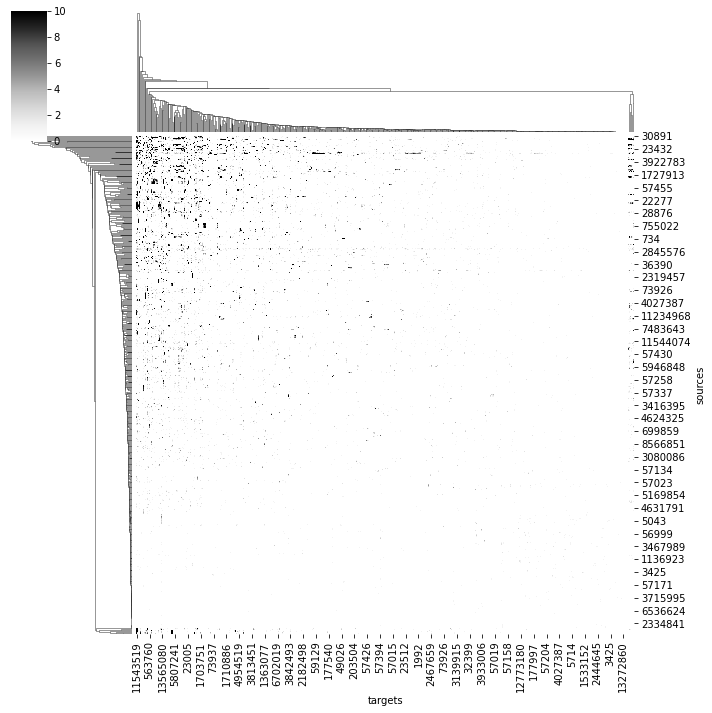

In [ ]:
# Plot a quick & dirty adjacency matrix
import seaborn as sns 

ax = sns.clustermap(adj, vmax=10, cmap='Greys')

We can also ask for where in space specific connections are made:

In [ ]:
# Axo-axonic connections between two different types of DA1 PNs
cn = pymaid.get_connectors_between(2863104, 1811442)
cn.head()

,connector_id,connector_loc,node1_id,source_neuron,confidence1,creator1,node1_loc,node2_id,target_neuron,confidence2,creator2,node2_loc
0,6736296,"[359448.44, 159319.03, 150560.0]",3163408,2863104,5,NaN,"[359487.3, 159145.66, 150600.0]",6736298,1811442,5,NaN,"[359611.9, 159541.48, 150560.0]"
1,6795172,"[356041.88, 149555.53, 147920.0]",6795195,2863104,5,NaN,"[354724.44, 149284.1, 147920.0]",6795153,1811442,5,NaN,"[356366.16, 149854.86, 147920.0]"
2,6795291,"[355189.5, 150232.48, 148240.0]",6795293,2863104,5,NaN,"[354595.62, 149464.8, 148240.0]",6795214,1811442,5,NaN,"[355472.28, 150294.75, 148160.0]"
3,6795747,"[355030.4, 154047.86, 145800.0]",6795749,2863104,5,NaN,"[355045.38, 154180.1, 145800.0]",6795745,1811442,5,NaN,"[355024.44, 153945.73, 145760.0]"
4,6797452,"[353221.4, 148570.9, 147320.0]",6797456,2863104,5,NaN,"[354213.9, 148397.44, 147320.0]",6797437,1811442,5,NaN,"[353447.6, 148704.88, 147560.0]"


In [ ]:
# Visualize
points = np.vstack(cn.connector_loc)

navis.plot3d([da1.idx[[2863104, 1811442]],  # plot the two neurons
              points],  # plot the points of synaptic contacts as scatter 
              scatter_kws=dict(name="synaptic contacts")
              )

<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=94cb7c07-bfd7-4142-b5f9-bec41746df04' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>